In [1]:
from glob import glob
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/regions_max/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
paths = glob('/stanley/WangLab/kamal/data/technologies/xenium/mouse_ad/filtered/*juxtacrine_dual.h5ad')
adatas = [sc.read_h5ad(path) for path in paths]

In [4]:
adatas

[AnnData object with n_obs × n_vars = 60829 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 59889 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58681 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58230 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58684 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obs

In [9]:
filter_key = 'juxtacrine_dual'
max_mag = 2

for i in range(len(adatas)):

    # Scale
    sc.pp.scale(adatas[i], layer=filter_key)

    # Clip
    X = adatas[i].layers[filter_key]
    X[X > max_mag] = max_mag
    X[X < -max_mag] = -max_mag

adata = sc.concat(adatas)

/home/unix/kmaher/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 15
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Disease-specific regions

## Embedding

In [7]:
def embed(adata, samples1, samples2, n_comps, filter_key):

    adata1 = adata[np.isin(adata.obs['sample'],samples1)]
    adata2 = adata[np.isin(adata.obs['sample'],samples2)]

    X = adata1.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata2.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

In [8]:
samples = adata.obs['sample'].unique()
samples1 = [sample for sample in samples if 'TgCRND8' in sample]
samples2 = [sample for sample in samples if 'wildtype' in sample]

In [9]:
n_comps = 1

V = embed(adata, samples1, samples2, n_comps, filter_key)

## Plot PCs

==================== PC1 ====================


/local/scratch/44890290.1.interactive/ipykernel_28295/3681731762.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f'c{i}'] = c
/home/unix/kmaher/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/unix/kmaher/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


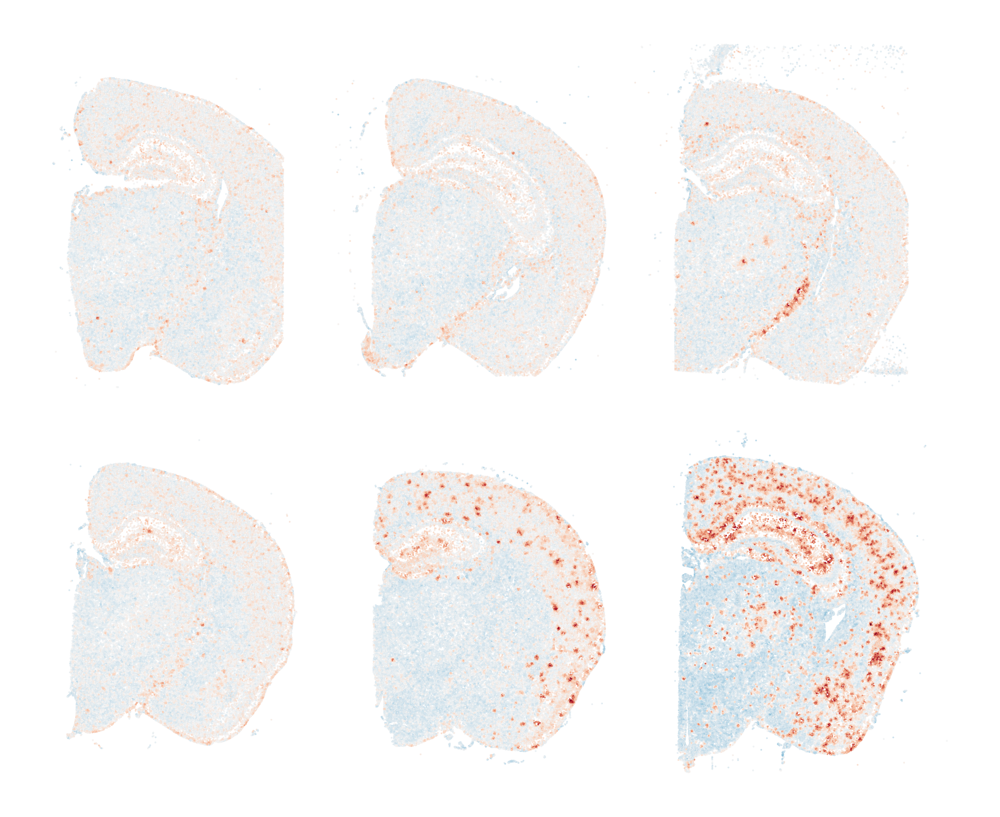

Positive markers:  ['Itgax', 'Gfap', 'Cd74', 'Serpina3n', 'Osmr', 'Gpnmb', 'Lyz2', 'Vim', 'Spp1', 'Cxcl10']
Negative markers:  ['Aldh1a2', 'Plekhb1', 'Itm2b', 'Slc13a4', 'Igf2', 'Rmst', 'Csf1r', 'Mbp', 'Tmem119', 'Cd24a']



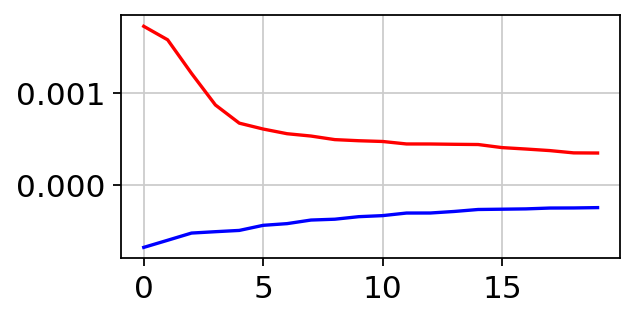

In [22]:
n_markers = 10
cmap = 'RdBu_r'

# for i in range(n_comps):
for i in range(1):

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    # Plot in tissue
    cmax = np.abs(c).max()
    # norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    norm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)
    points = adata.obsm['spatial']
    plt.figure(figsize=figsize)
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=2,
        c=c,
        cmap=cmap,
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'region_pc{i+1}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

### Zoom 1

In [11]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

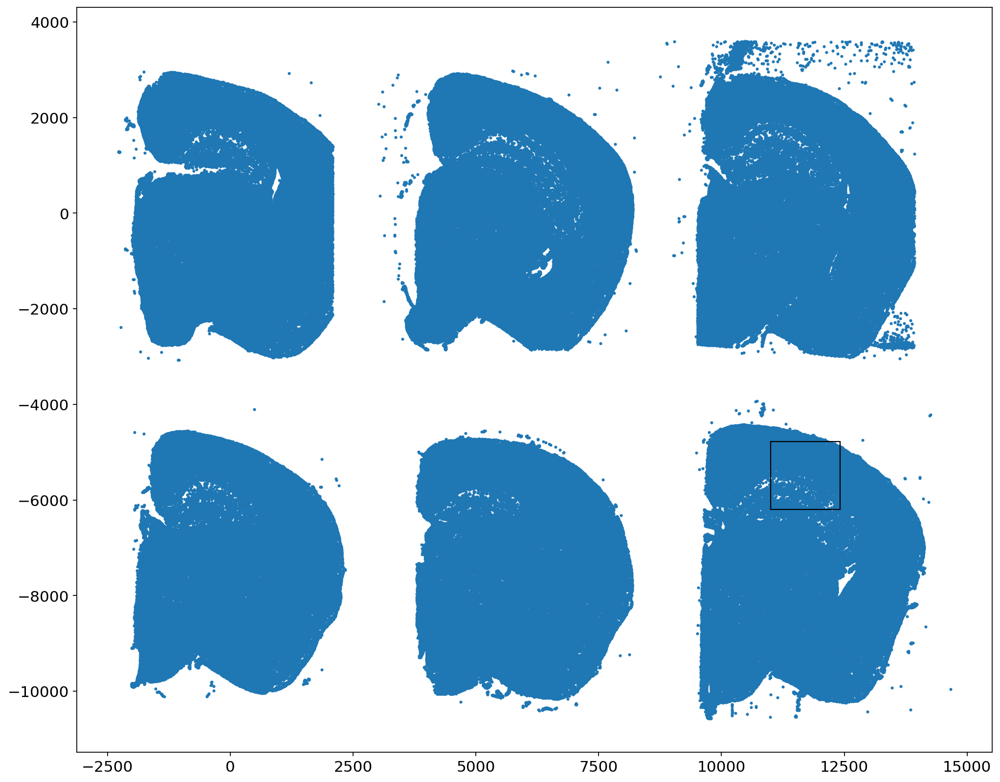

In [12]:
# /8
zoom_x = 11000
zoom_y = -6200

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [13]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

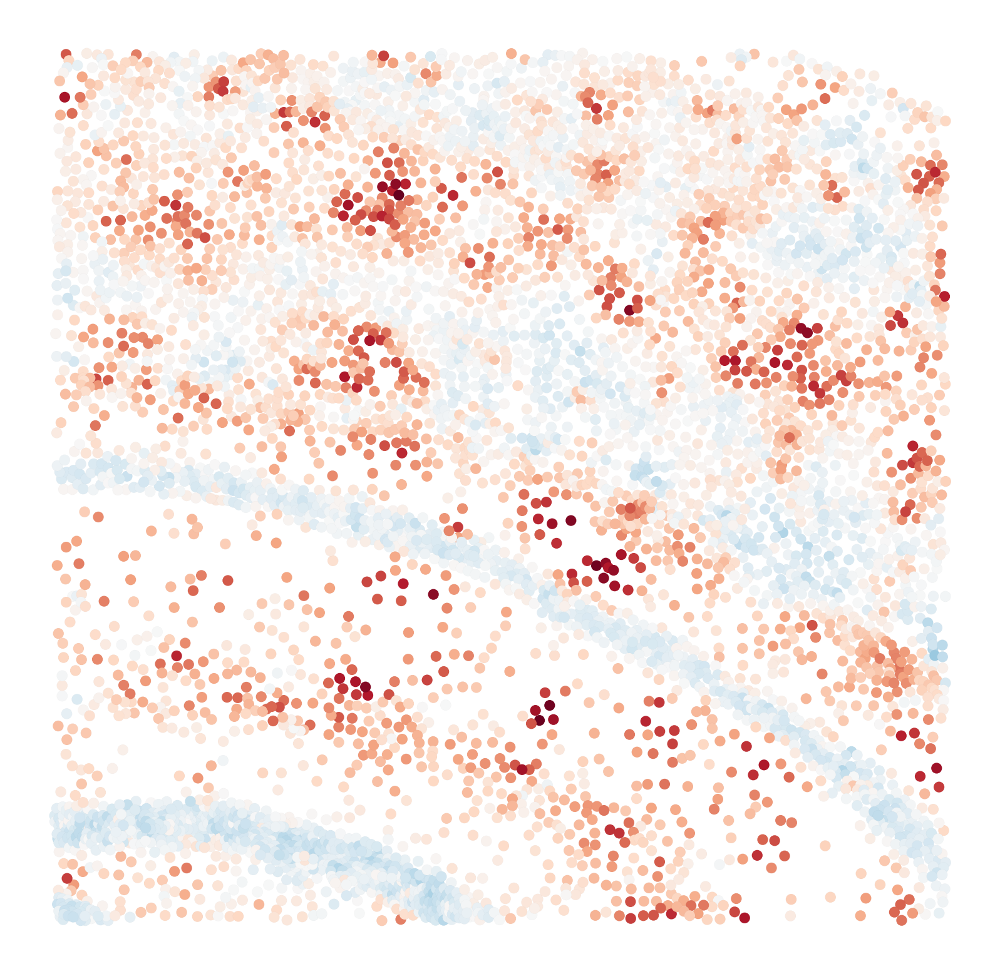

In [16]:
# Plot in tissue
i = 0
c = zdata.obs[f'c{i}']
cmax = np.abs(c).max()
# norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
norm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.005,
    s=60,
    c=c,
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'region_pc{i+1}_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()

### Zoom 2

In [23]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

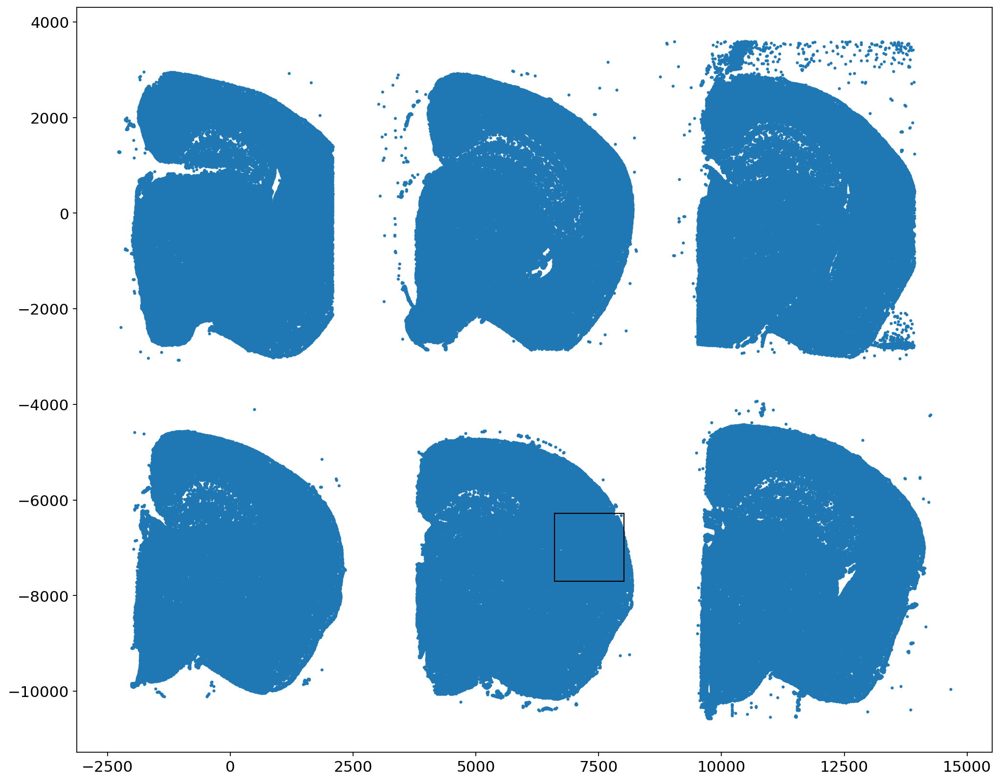

In [24]:
# /8
zoom_x = 6600
zoom_y = -7700

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [25]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

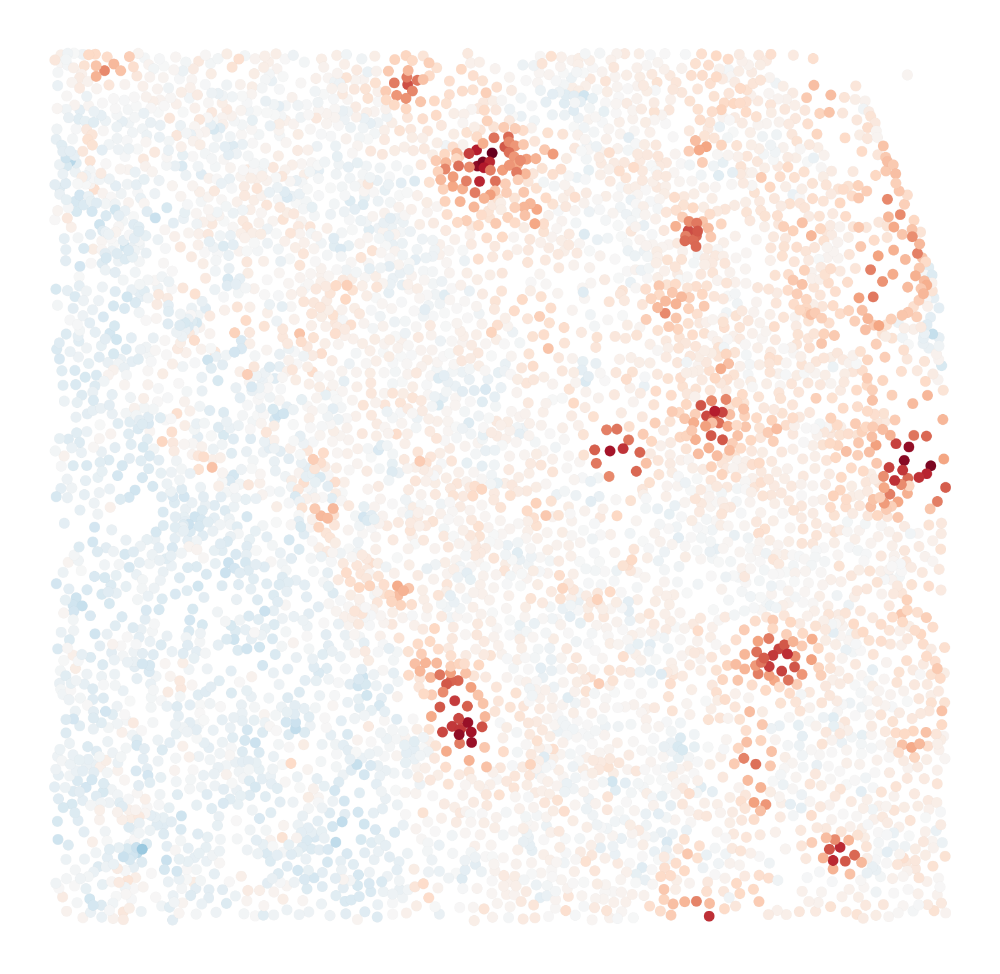

In [26]:
# Plot in tissue
i = 0
c = zdata.obs[f'c{i}']
cmax = np.abs(c).max()
# norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
norm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.005,
    s=60,
    c=c,
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'region_pc{i+1}_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Clustering

In [10]:
# n_pcs = 5
# pca = PCA(n_components=n_pcs, random_state=0)
# adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[filter_key])
# adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [11]:
n_regions = 3
kmeans = KMeans(n_clusters=n_regions, random_state=0)
kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
adata.obs['region'] = kmeans.labels_.astype(str)

/stanley/WangLab/kamal/envs/xax/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


## Plot markers

In [12]:
sc.tl.rank_genes_groups(adata, groupby='region', layer=filter_key)
# sc.tl.dendrogram(adata, groupby='region', use_rep=f'X_pca_{filter_key}')

/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


         Falling back to preprocessing with `sc.pp.pca` and default params.


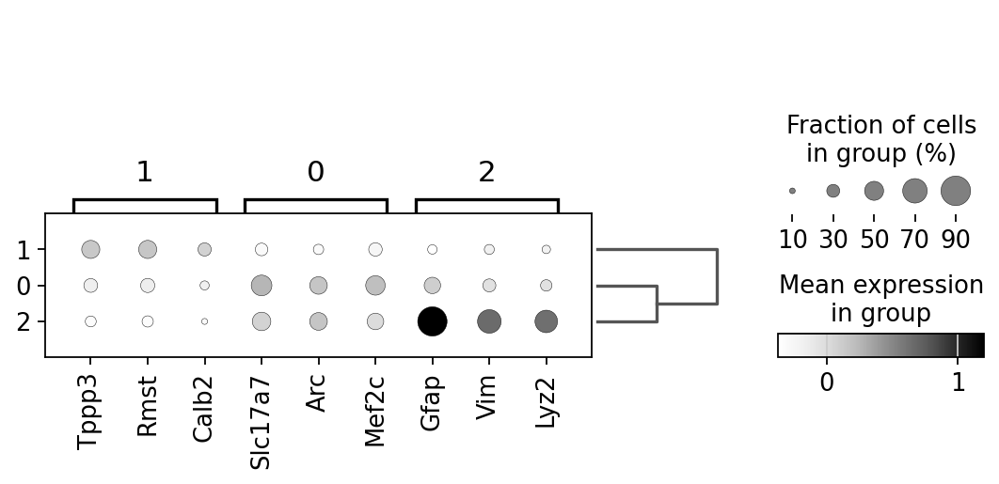

In [13]:
fig = plt.figure(figsize=(8,3))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='region', n_genes=3, layer=filter_key, ax=ax, cmap='Greys')
figname = 'region_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

## Plot tissue

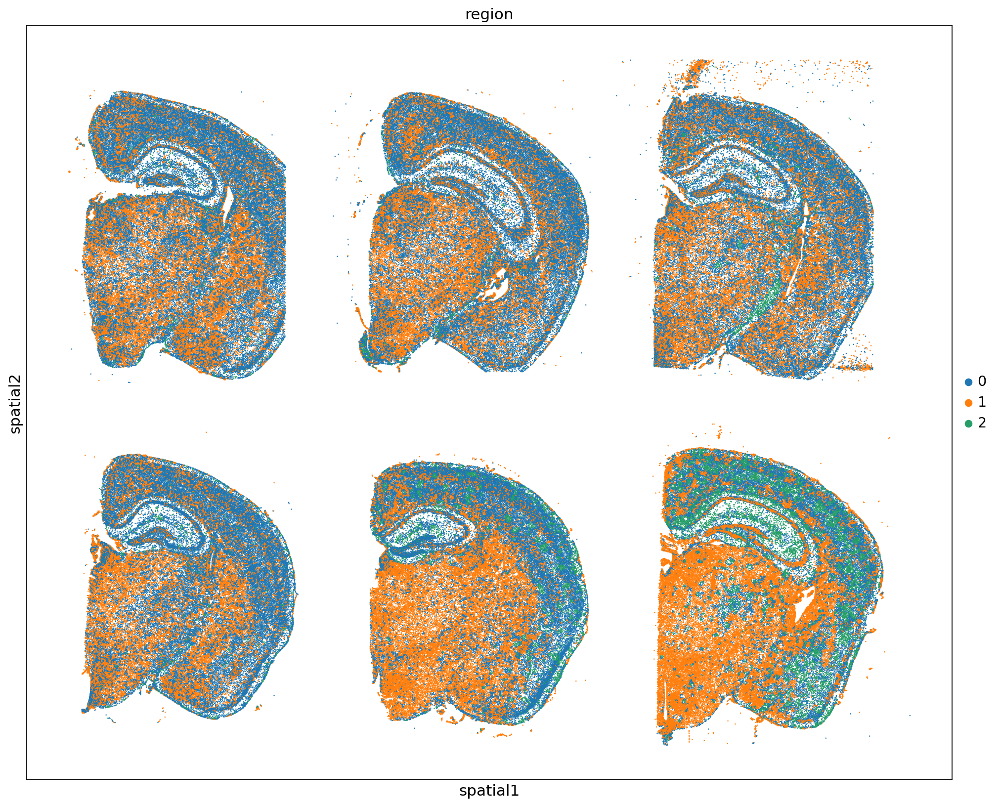

In [14]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='region',
    s=5
)

In [15]:
adata.obs['is_plaque'] = adata.obs['region'] == '2'
sorted_idxs = np.argsort(adata.obs['is_plaque']).values
adata = adata[sorted_idxs]

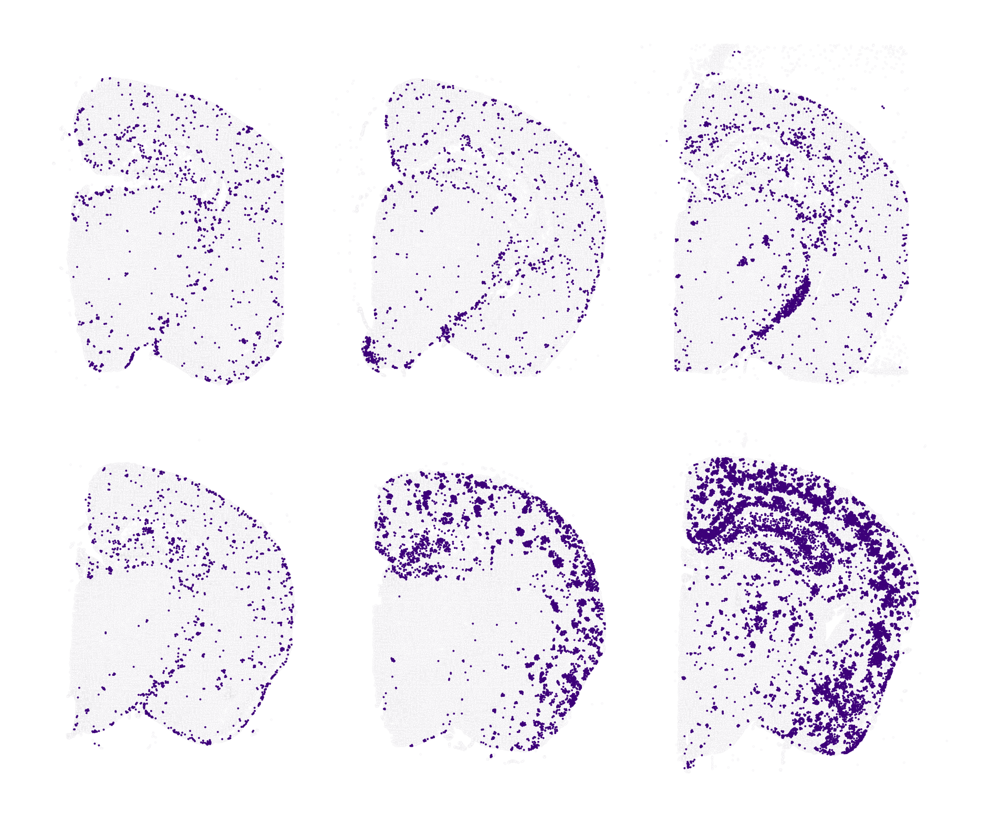

In [16]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=3,
    c=adata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'regions.png')
plt.savefig(filename, dpi=dpi)
plt.show()

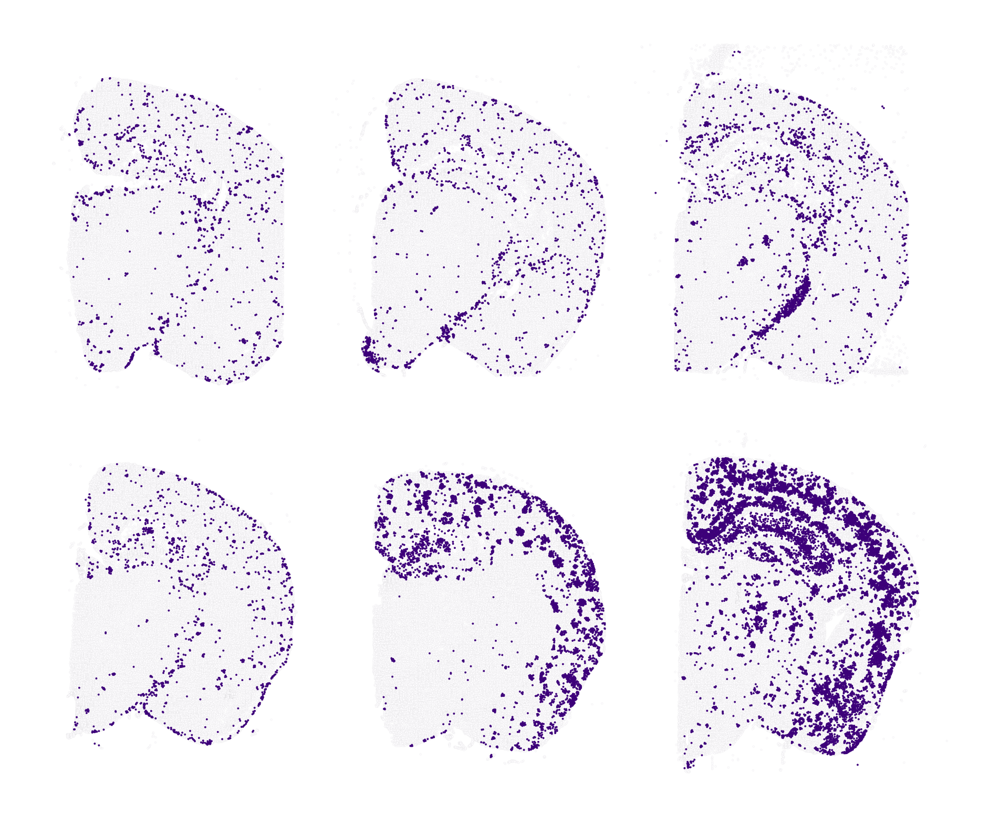

In [54]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=3,
    c=adata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'regions.png')
plt.savefig(filename, dpi=dpi)
plt.show()

### Zoom 1

In [45]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

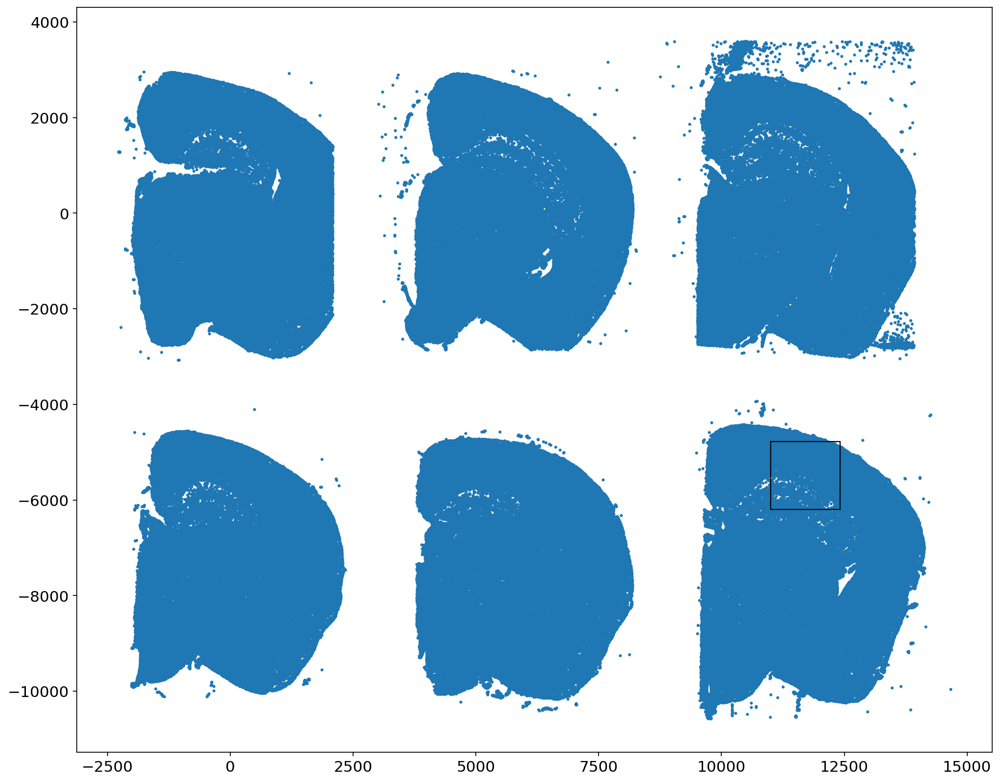

In [47]:
# /8
zoom_x = 11000
zoom_y = -6200

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [48]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [49]:
sorted_idxs = np.argsort(zdata.obs['is_plaque']).values
zdata = zdata[sorted_idxs]

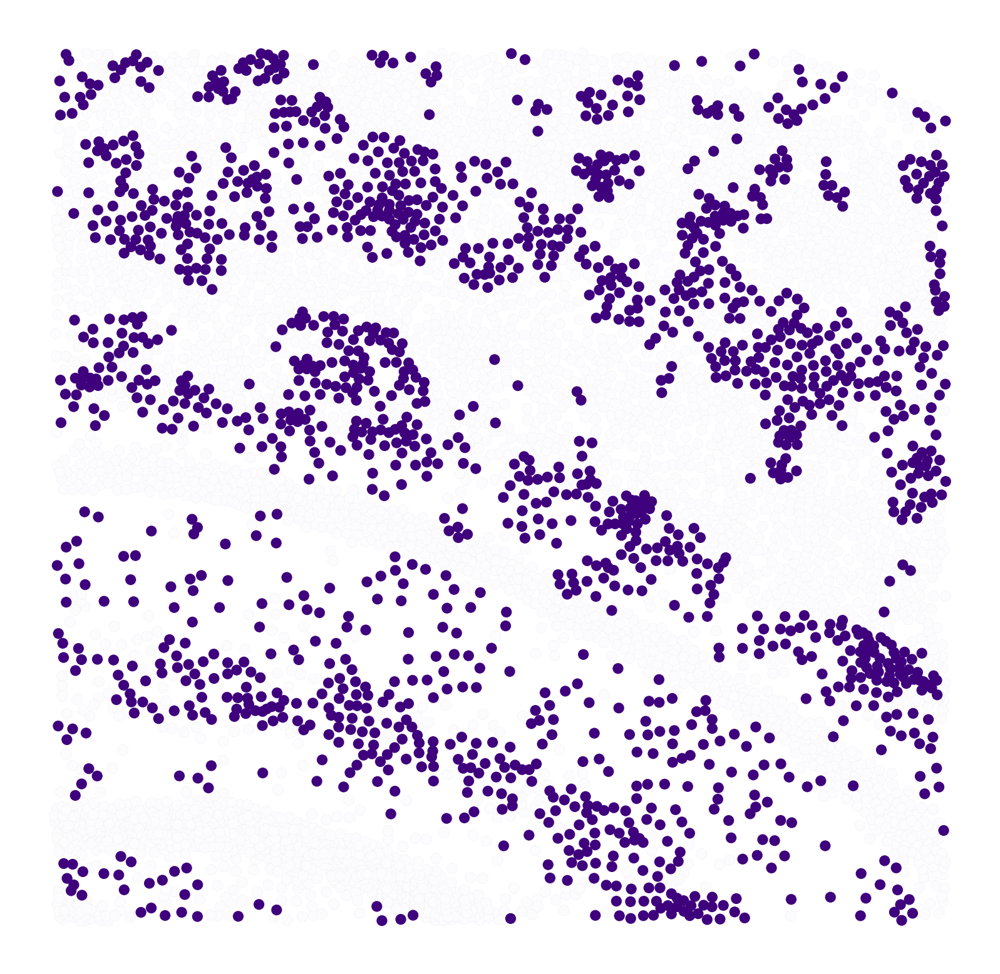

In [50]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=60,
    c=zdata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'region_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()

### Zoom 2

In [17]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

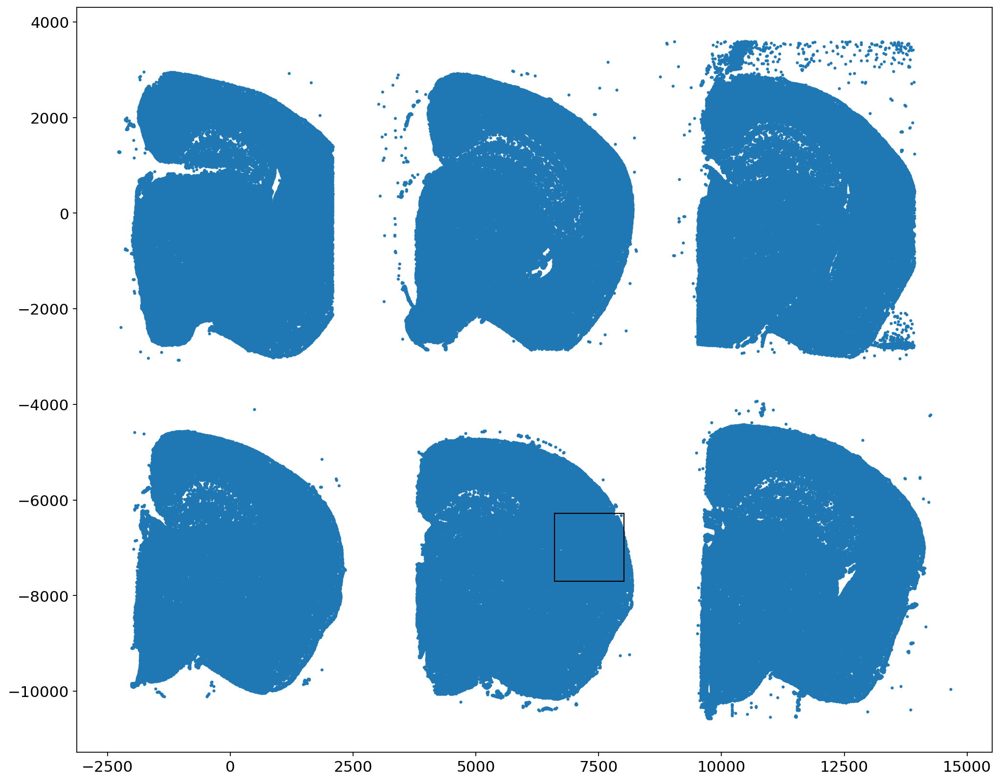

In [18]:
# /8
zoom_x = 6600
zoom_y = -7700

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [19]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [20]:
sorted_idxs = np.argsort(zdata.obs['is_plaque']).values
zdata = zdata[sorted_idxs]

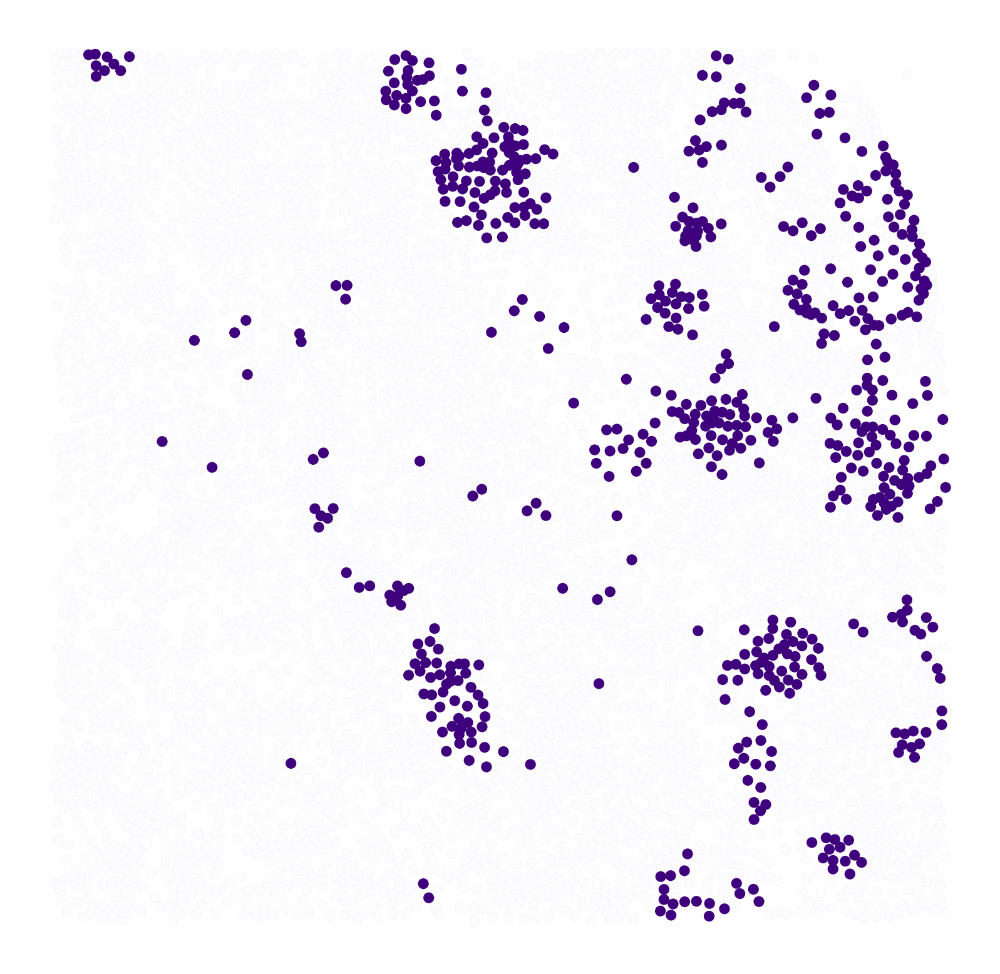

In [21]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=60,
    c=zdata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'region_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()